In [37]:
import sys
import stlearn as st
st.settings.set_figure_params(dpi=300)
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import sys
file = Path("../stimage").resolve()
parent= file.parent
sys.path.append(str(parent))
from PIL import Image
from stimage.utils import gene_plot, Read10X, ReadOldST
from stimage.model import CNN_NB_trainable
from stimage.data_generator import DataGenerator
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

In [2]:
BASE_PATH = Path("/clusterdata/uqxtan9/Xiao/STimage/dataset/breast_cancer_10x_visium")
TILE_PATH = Path("/tmp") / "tiles"
TILE_PATH.mkdir(parents=True, exist_ok=True)

SAMPLE = "block1"
Sample1 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif", 0)
Sample1.uns["spatial"][SAMPLE]['images']["fulres"] = img

SAMPLE = "block2"
Sample2 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_2_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_2_image.tif", 0)
Sample2.uns["spatial"][SAMPLE]['images']["fulres"] = img

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [3]:
gene_list=["SLITRK6", "PGM5", "LINC00645", 
           "TTLL12", "COX6C", "CPB1",
           "KRT5", "MALAT1"]
gene = gene_list[0]
print(len(gene_list))

8


In [4]:
for adata in [
    Sample1,
    Sample2,
]:
#     count_df = adata.to_df()
#     count_df[count_df <=1] = 0
#     count_df[count_df >1] = 1
#     adata.X = count_df
#     adata[:,gene_list]
#     st.pp.filter_genes(adata,min_cells=3)
    st.pp.normalize_total(adata)
    st.pp.log1p(adata)
#     st.pp.scale(adata)

    # pre-processing for spot image
    TILE_PATH_ = TILE_PATH / list(adata.uns["spatial"].keys())[0]
    TILE_PATH_.mkdir(parents=True, exist_ok=True)
    st.pp.tiling(adata, TILE_PATH_, crop_size=224, target_size=224)

Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]


Normalization step is finished in adata.X
Log transformation step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]


In [5]:
import numpy as np
import imgaug as ia
from imgaug import augmenters as iaa

ia.seed(3)
sometimes = lambda aug: iaa.Sometimes(0.5, aug)

seq_aug = iaa.Sequential(
    [
        sometimes(iaa.Fliplr(0.5)), # horizontally flip 50% of all images
        sometimes(iaa.Flipud(0.5)), # vertically flip 50% of all images
        sometimes(iaa.Affine(
            rotate=(-90, 90), # rotate by -45 to +45 degrees
        )),
    ],
    random_order=True
)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet
import numpy as np

class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'

    def __init__(self, adata, dim=(299, 299), n_channels=3, genes=None, aug=False):
        'Initialization'
        self.dim = dim
        self.adata = adata
        self.n_channels = n_channels
        self.genes = genes
        self.num_genes = len(genes)
        self.aug = aug
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(self.adata.n_obs)

    def __getitem__(self, index):
        'Generate one batch of data'
        # Find list of IDs
        obs_temp = self.adata.obs_names[index]

        # Generate data
        X_img = self._load_img(obs_temp)
        y = self._load_label(obs_temp)

        return X_img, y


    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(self.adata.n_obs)


    def _load_img(self, obs):
        img_path = self.adata.obs.loc[obs, 'tile_path']
        X_img = image.load_img(img_path, target_size=self.dim)
        X_img = image.img_to_array(X_img).astype('uint8')
#         X_img = np.expand_dims(X_img, axis=0)
#         n_rotate = np.random.randint(0, 4)
#         X_img = np.rot90(X_img, k=n_rotate, axes=(1, 2))
        if self.aug:
            X_img = seq_aug(image=X_img)
        X_img = preprocess_resnet(X_img)
        return X_img

    def _load_label(self, obs):
        return self.adata.to_df().loc[obs, self.genes]

    def get_classes(self):
        return self.adata.to_df().loc[:,self.genes]

In [24]:
training_index = Sample1.obs.sample(frac=0.70, random_state=1).index
training_dataset = Sample1[training_index,].copy()

valid_index = Sample1.obs.index.isin(training_index)
valid_dataset = Sample1[~valid_index,].copy()

test_dataset = Sample2.copy()

train_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=training_dataset,
                                 dim=(224, 224),
                          genes=[gene], aug=True),
            output_types=(tf.float32, tf.float32), 
            output_shapes=([224,224,3], [1])
)
train_gen_ = train_gen.shuffle(buffer_size=500).batch(128).repeat(3).cache().prefetch(tf.data.experimental.AUTOTUNE)
valid_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=valid_dataset, 
                                 dim=(224, 224),
                          genes=[gene]), 
            output_types=(tf.float32, tf.float32), 
            output_shapes=([224,224,3], [1])
)
valid_gen_ = valid_gen.shuffle(buffer_size=500).batch(128).repeat(3).cache().prefetch(tf.data.experimental.AUTOTUNE)
test_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=test_dataset, 
                                 dim=(224, 224),
                          genes=[gene]), 
            output_types=(tf.float32, tf.float32), 
            output_shapes=([224,224,3], [1])
)
test_gen_ = test_gen.batch(1)

In [19]:
mean_exp = training_dataset[:,gene].to_df().mean()
mean_exp

SLITRK6    0.53532
dtype: float32

In [20]:
mean_exp_tf = tf.keras.initializers.RandomUniform(minval=mean_exp, 
                                                  maxval=mean_exp)

In [21]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input as preprocess_vgg16
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input as preprocess_resnet50
from tensorflow.keras.applications.densenet import DenseNet121, preprocess_input as preprocess_densenet
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input, concatenate, Dropout, Lambda
from tensorflow.keras.models import Model
from tensorflow.python.keras import backend as K
from tensorflow.python.keras.utils.tf_utils import is_tensor_or_variable


def STNet(tile_shape, output_shape):
    tile_input = Input(shape=tile_shape, name = "tile_input")
    DenseNet121_base = DenseNet121(input_tensor=tile_input, weights='imagenet', include_top=False)
    for layer in DenseNet121_base.layers:
        layer.trainable = False
    
    cnn = DenseNet121_base.output
    cnn = GlobalAveragePooling2D()(cnn)
#     cnn = Dropout(0.5)(cnn)
#     cnn = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l1(0.01),
#                 activity_regularizer=tf.keras.regularizers.l2(0.01))(cnn)
    # cnn = Dense(256, activation='relu')(cnn)
    
    outputs = Dense(output_shape, activation='linear', bias_initializer=mean_exp_tf)(cnn)
    model = Model(inputs=tile_input, outputs=outputs)

#     optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.SGD(learning_rate=1e-6, momentum=0.9)

    model.compile(loss="mse",
                  optimizer=optimizer,
                  metrics=[tf.keras.metrics.MeanSquaredError()])    
    return model

In [22]:
model = STNet((224, 224, 3), 1)

In [25]:
train_history = model.fit(train_gen_,
                          epochs=100,
                          validation_data=valid_gen_)

Epoch 1/100
63/63 [==============================] - 1252s 19s/step - loss: 6.6657 - mean_squared_error: 6.6657 - val_loss: 1.9665 - val_mean_squared_error: 1.9665
Epoch 2/100
63/63 [==============================] - 11s 173ms/step - loss: 3.1715 - mean_squared_error: 3.1715 - val_loss: 1.6276 - val_mean_squared_error: 1.6276
Epoch 3/100
63/63 [==============================] - 11s 170ms/step - loss: 2.5426 - mean_squared_error: 2.5426 - val_loss: 1.4687 - val_mean_squared_error: 1.4687
Epoch 4/100
63/63 [==============================] - 11s 170ms/step - loss: 2.1956 - mean_squared_error: 2.1956 - val_loss: 1.3559 - val_mean_squared_error: 1.3559
Epoch 5/100
63/63 [==============================] - 11s 170ms/step - loss: 1.9707 - mean_squared_error: 1.9707 - val_loss: 1.2711 - val_mean_squared_error: 1.2711
Epoch 6/100
63/63 [==============================] - 11s 170ms/step - loss: 1.8170 - mean_squared_error: 1.8170 - val_loss: 1.2063 - val_mean_squared_error: 1.2063
Epoch 7/100
63/6

Epoch 51/100
63/63 [==============================] - 11s 170ms/step - loss: 0.9692 - mean_squared_error: 0.9692 - val_loss: 0.7395 - val_mean_squared_error: 0.7395
Epoch 52/100
63/63 [==============================] - 11s 170ms/step - loss: 0.9639 - mean_squared_error: 0.9639 - val_loss: 0.7369 - val_mean_squared_error: 0.7369
Epoch 53/100
63/63 [==============================] - 11s 171ms/step - loss: 0.9587 - mean_squared_error: 0.9587 - val_loss: 0.7343 - val_mean_squared_error: 0.7343
Epoch 54/100
63/63 [==============================] - 11s 170ms/step - loss: 0.9537 - mean_squared_error: 0.9537 - val_loss: 0.7318 - val_mean_squared_error: 0.7318
Epoch 55/100
63/63 [==============================] - 11s 170ms/step - loss: 0.9487 - mean_squared_error: 0.9487 - val_loss: 0.7293 - val_mean_squared_error: 0.7293
Epoch 56/100
63/63 [==============================] - 11s 170ms/step - loss: 0.9439 - mean_squared_error: 0.9439 - val_loss: 0.7269 - val_mean_squared_error: 0.7269
Epoch 57/1

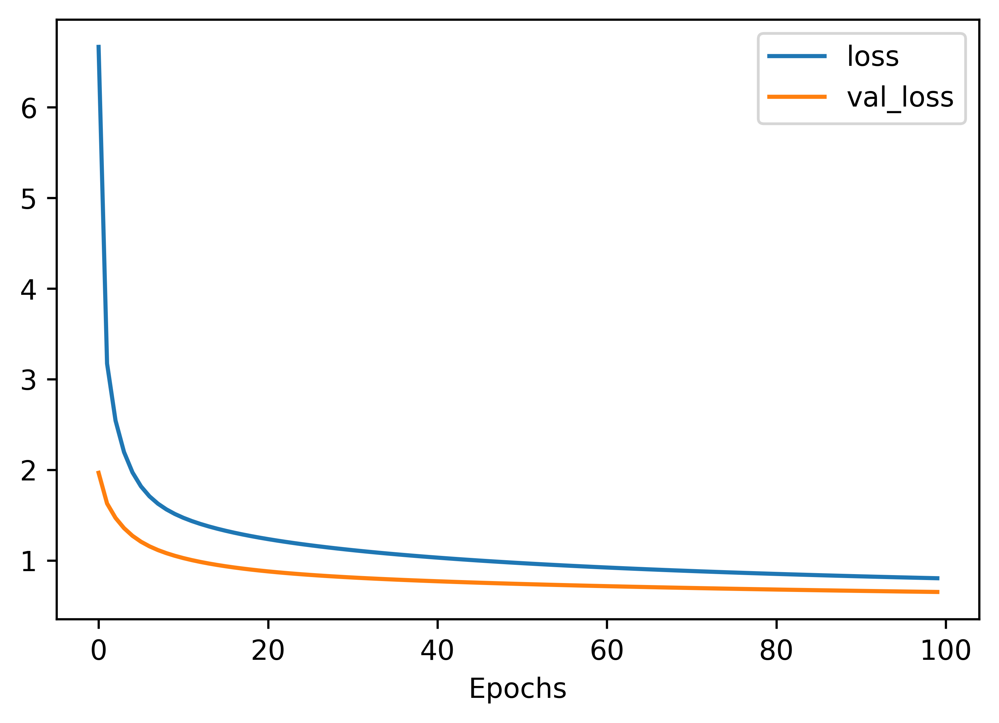

In [26]:
plt.plot(train_history.history['loss'])
plt.plot(train_history.history['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.xlabel('Epochs')
plt.show()

In [29]:
test_predictions = model.predict(test_gen_)

test_dataset.obsm["predicted_gene"] = test_predictions

/scratch/imb/Xiao/STimage/stimage/utils.py:106: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(plot, cax=fig.add_axes(


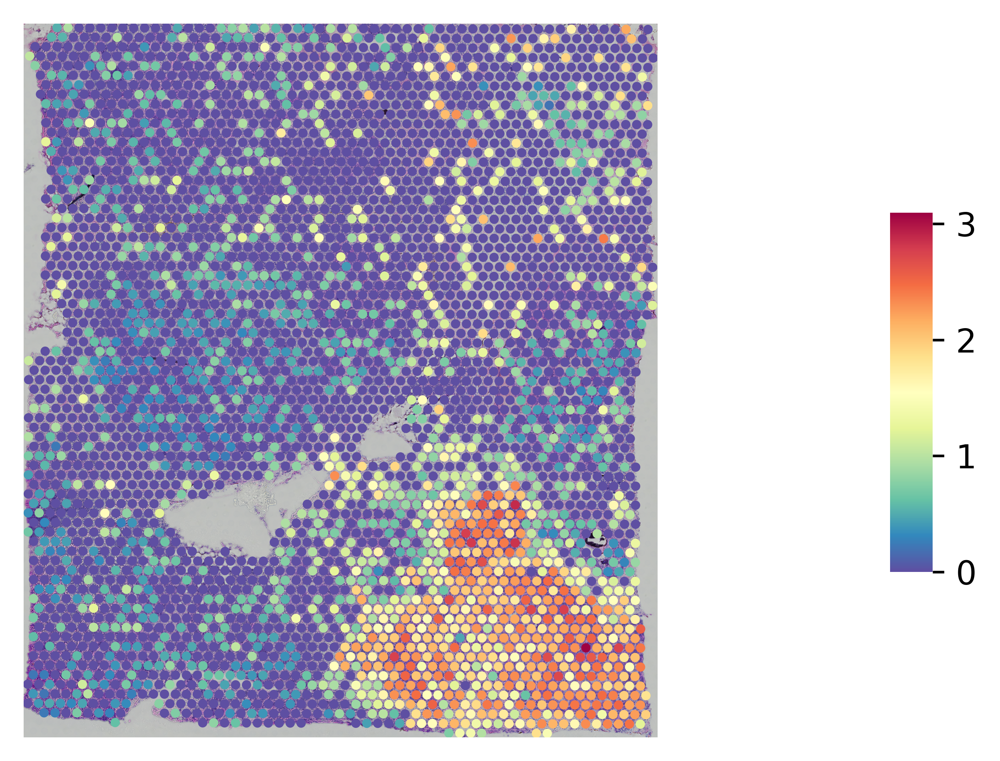

In [27]:
gene_plot(test_dataset, genes=gene, spot_size=8)

In [30]:
test_dataset_ = test_dataset[:,gene].copy()
test_dataset_.X = test_dataset_.obsm["predicted_gene"]

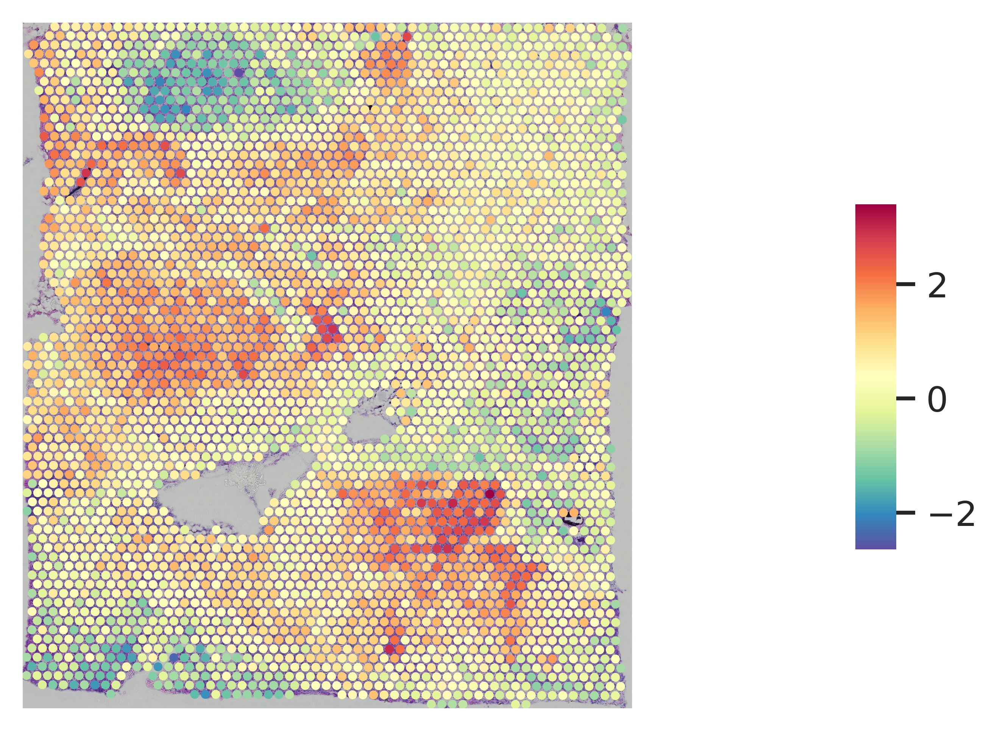

In [39]:
gene_plot(test_dataset_, genes=gene, spot_size=8)

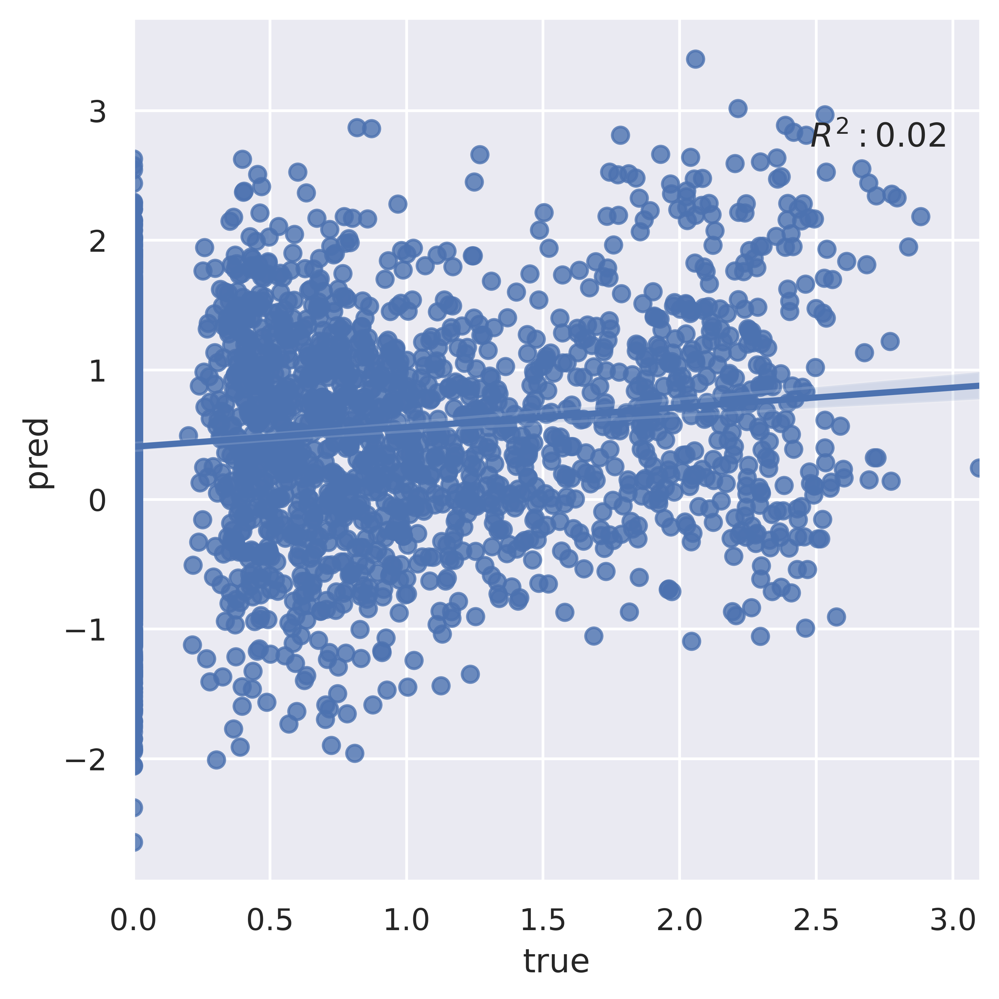

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

true_y = np.array(test_dataset[:,gene].to_df()).ravel()
pred_y = np.array(test_dataset_[:,gene].to_df()).ravel()
df = pd.DataFrame({"true_y":true_y, "pred_y":pred_y})
r2 = stats.pearsonr(true_y, 
                    pred_y)[0] ** 2
sns.set_theme()
g = sns.lmplot(data=df,
    x="true_y", y="pred_y",
    height=5, legend=True
)
# g.set(ylim=(0, 360), xlim=(0,360))

g.set_axis_labels("true", "pred")
plt.annotate(r'$R^2:{0:.2f}$'.format(r2),
            (max(true_y)*0.8, max(pred_y)*0.8))
plt.show()